<a href="https://colab.research.google.com/github/likhithaap/Car-damage-assesment-deep-learning-/blob/main/parts_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html


     |████████████████████████████████| 274 kB 4.7 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=6067719db222fd7e5b442d2b40732a8d9c46bb8d19695f3ee3800b0f76b550e3
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 1.1 MB/s 
     |████████████████████████████████| 74 kB 2.2 MB/s 
     |████████████████████████████████| 145 kB 11.0 MB/s 
     |████████████████████████████████| 130 kB 44.6 MB/s 
     |████████████████████████████████| 50 kB 6.1 MB/s 
     |████████████████████████████████| 749 kB 48.2 MB/s 
     |███████████████████████████████

In [1]:
# Some basic setup
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [2]:
! unzip archive.zip




Archive:  archive.zip
  inflating: img/1.jpg               
  inflating: img/10.jpg              
  inflating: img/13.jpg              
  inflating: img/14.jpg              
  inflating: img/15.jpg              
  inflating: img/16.jpg              
  inflating: img/17.jpg              
  inflating: img/18.jpg              
  inflating: img/19.jpg              
  inflating: img/2.jpg               
  inflating: img/20.jpg              
  inflating: img/21.jpg              
  inflating: img/22.jpg              
  inflating: img/23.jpg              
  inflating: img/24.jpg              
  inflating: img/25.jpg              
  inflating: img/26.jpg              
  inflating: img/27.jpg              
  inflating: img/29.jpg              
  inflating: img/3.jpg               
  inflating: img/30.jpg              
  inflating: img/31.jpg              
  inflating: img/32.jpg              
  inflating: img/33.jpg              
  inflating: img/34.jpg              
  inflating: img/36.jpg     

In [4]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/COCO_mul_train_annos.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/val/COCO_mul_val_annos.json", "/content/val")


In [5]:
dataset_dicts = DatasetCatalog.get("my_dataset_train")
val_dataset_dicts = DatasetCatalog.get("my_dataset_val")
metadata_dicts = MetadataCatalog.get("my_dataset_train")
val_metadata_dicts = MetadataCatalog.get("my_dataset_val")


[03/19 11:00:38 d2.data.datasets.coco]: Loaded 59 images in COCO format from /content/train/COCO_mul_train_annos.json
[03/19 11:00:38 d2.data.datasets.coco]: Loaded 11 images in COCO format from /content/val/COCO_mul_val_annos.json


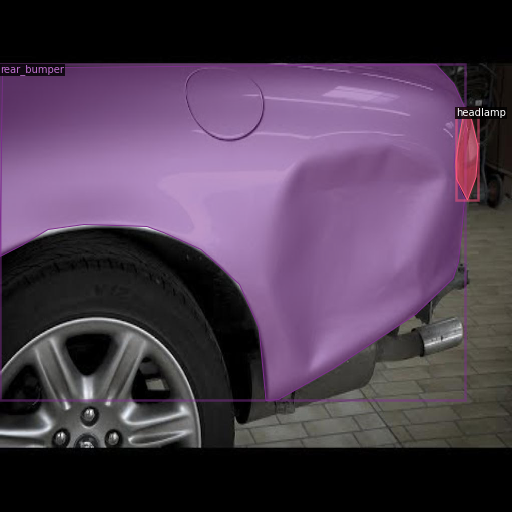

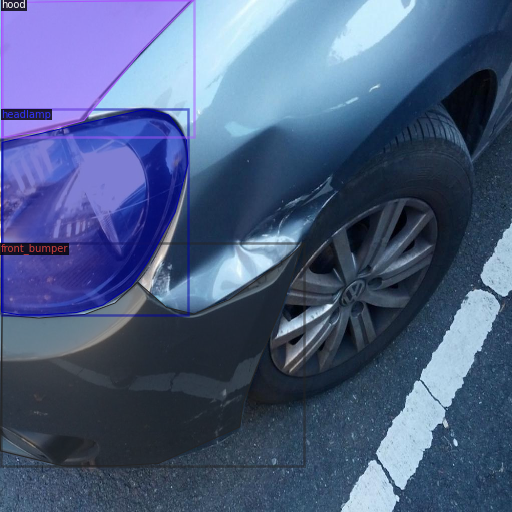

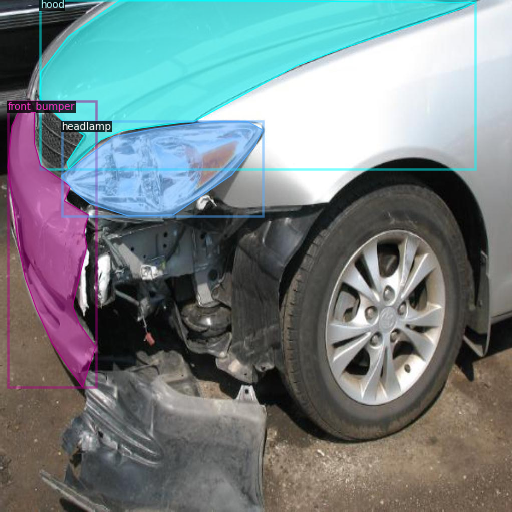

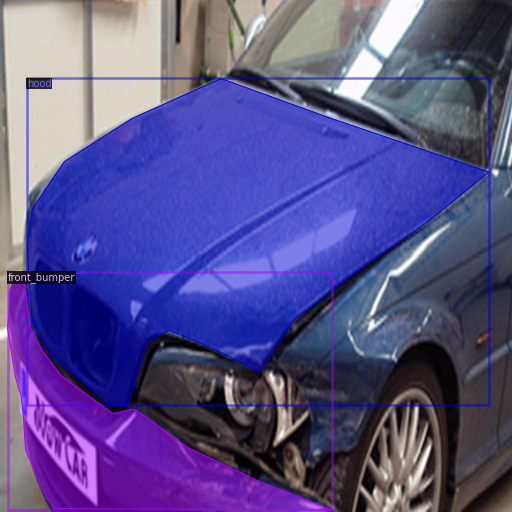

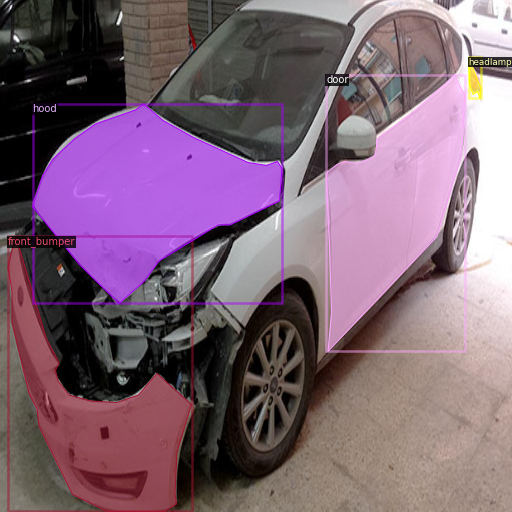

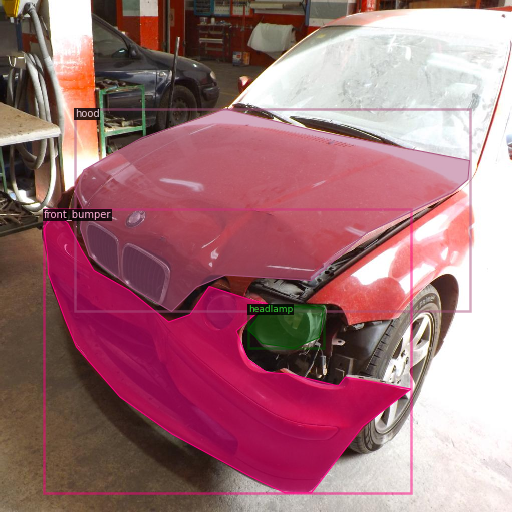

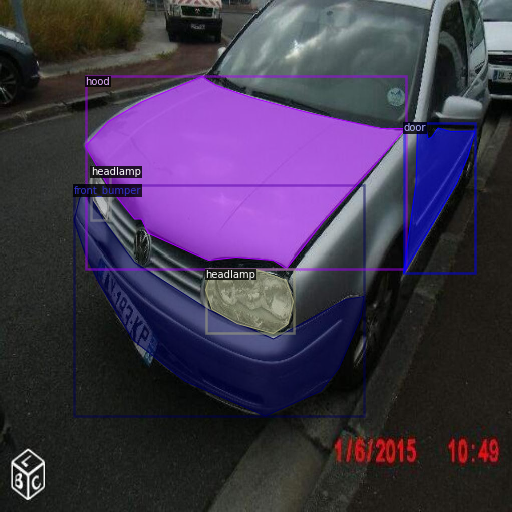

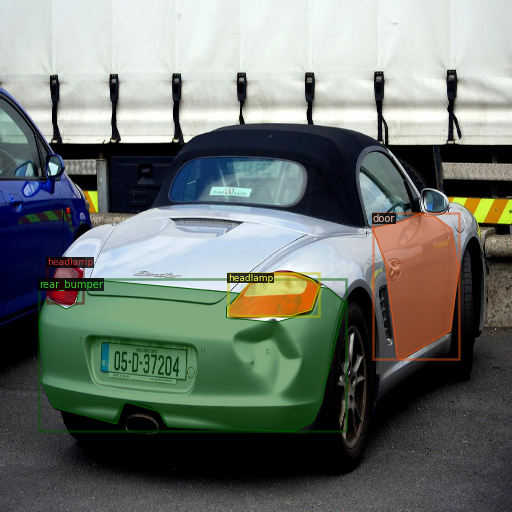

In [6]:
import random

for d in random.sample(dataset_dicts, 8):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata_dicts, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])


In [7]:
from detectron2 import model_zoo
import os
plt.rcParams["figure.figsize"] = [16,9]

In [8]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)
    

In [14]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
cfg.SOLVER.WARMUP_ITERS = 100
cfg.SOLVER.MAX_ITER = 300 #adjust up if val mAP is still rising, adjust down if overfit
#cfg.SOLVER.STEPS = (600, 800)
cfg.SOLVER.GAMMA = 0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this  dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 6  # only has one class (damage) + 1
cfg.MODEL.RETINANET.NUM_CLASSES = 6 # only has one class (damage) + 1
#cfg.TEST.EVAL_PERIOD = 100

# Clear any logs from previous runs
#TODO add timestamp to logs
!rm -rf cfg.OUTPUT_DIR


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/19 11:20:24 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (7, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (7,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in th

[03/19 11:20:24 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[03/19 11:21:02 d2.utils.events]:  eta: 0:09:00  iter: 19  total_loss: 3.315  loss_cls: 1.796  loss_box_reg: 0.7368  loss_mask: 0.69  loss_rpn_cls: 0.1079  loss_rpn_loc: 0.02554  time: 1.8797  data_time: 0.0516  lr: 0.00019081  max_mem: 7022M
[03/19 11:21:39 d2.utils.events]:  eta: 0:08:14  iter: 39  total_loss: 2.356  loss_cls: 0.8257  loss_box_reg: 0.773  loss_mask: 0.6565  loss_rpn_cls: 0.04102  loss_rpn_loc: 0.01823  time: 1.8650  data_time: 0.0253  lr: 0.00039061  max_mem: 7022M
[03/19 11:22:56 d2.utils.events]:  eta: 0:07:23  iter: 59  total_loss: 2.196  loss_cls: 0.7194  loss_box_reg: 0.8432  loss_mask: 0.5716  loss_rpn_cls: 0.031  loss_rpn_loc: 0.01775  time: 2.5522  data_time: 0.0244  lr: 0.00059041  max_mem: 7022M
[03/19 11:23:33 d2.utils.events]:  eta: 0:06:45  iter: 79  total_loss: 1.961  loss_cls: 0.6356  loss_box_reg: 0.8141  loss_mask: 0.4772  loss_rpn_cls: 0.02478  loss_rpn_loc: 0.01752  time: 2.3714  data_time: 0.0271  lr: 0.00079021  max_mem: 7022M
[03/19 11:24:10 d2.

In [15]:
%load_ext tensorboard
import tensorflow as tf
import datetime, os
%tensorboard --logdir "./output"



<IPython.core.display.Javascript object>

In [16]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7 # set a testing threshold
cfg.DATASETS.TEST = ("my_dataset_val", )
predictor = DefaultPredictor(cfg)

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


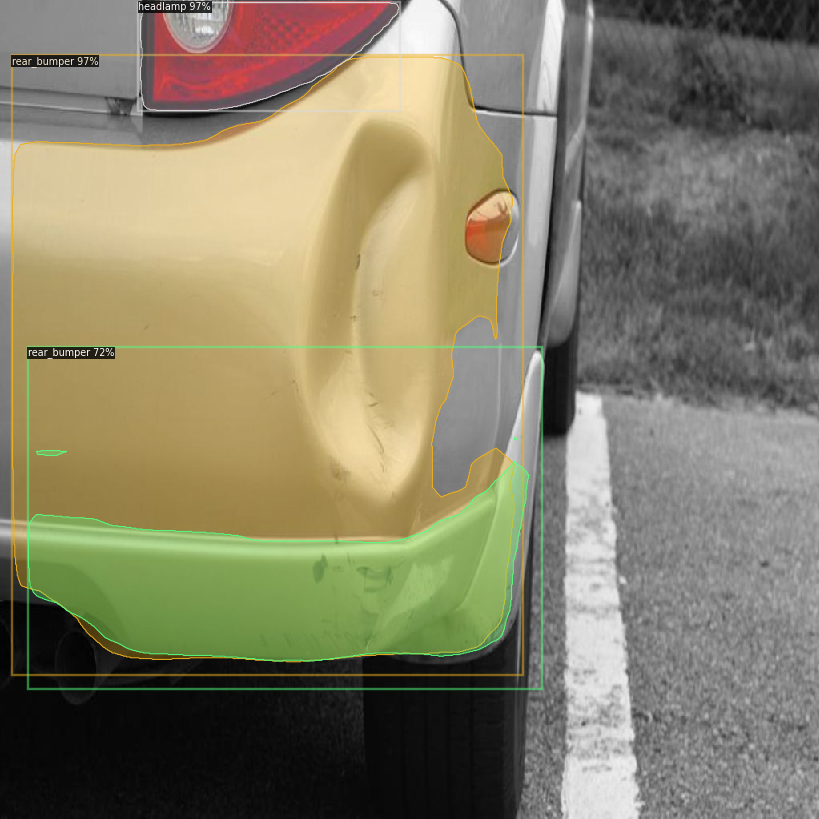

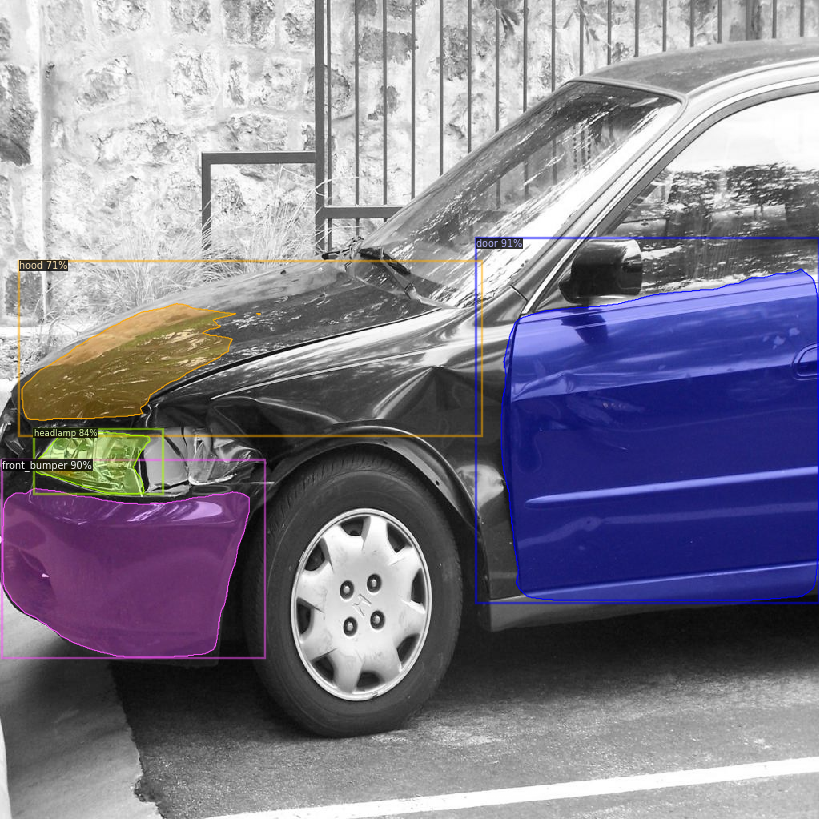

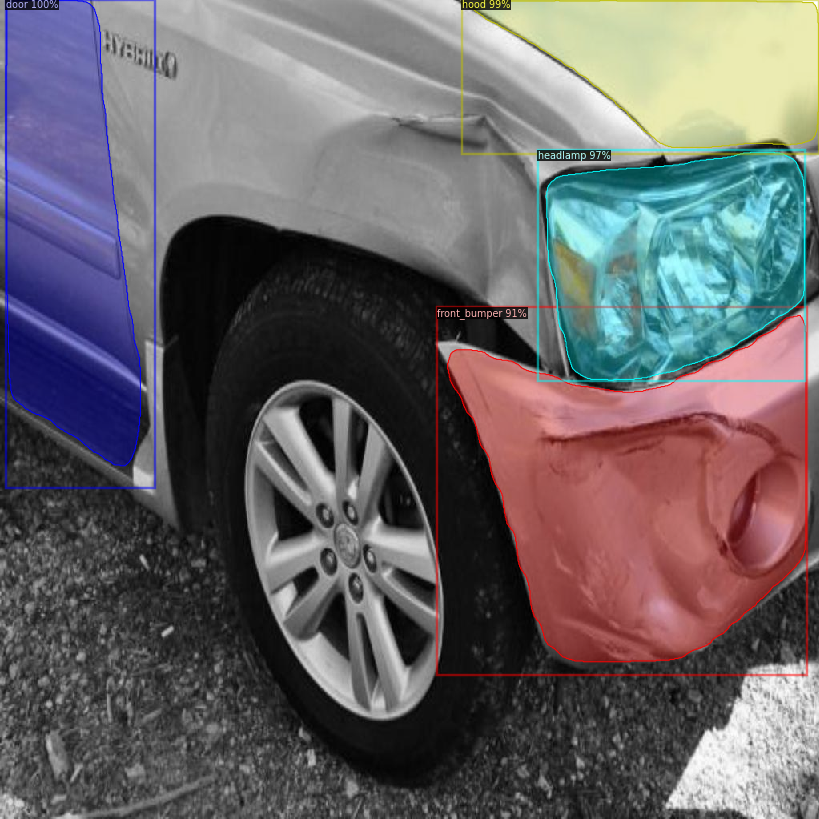

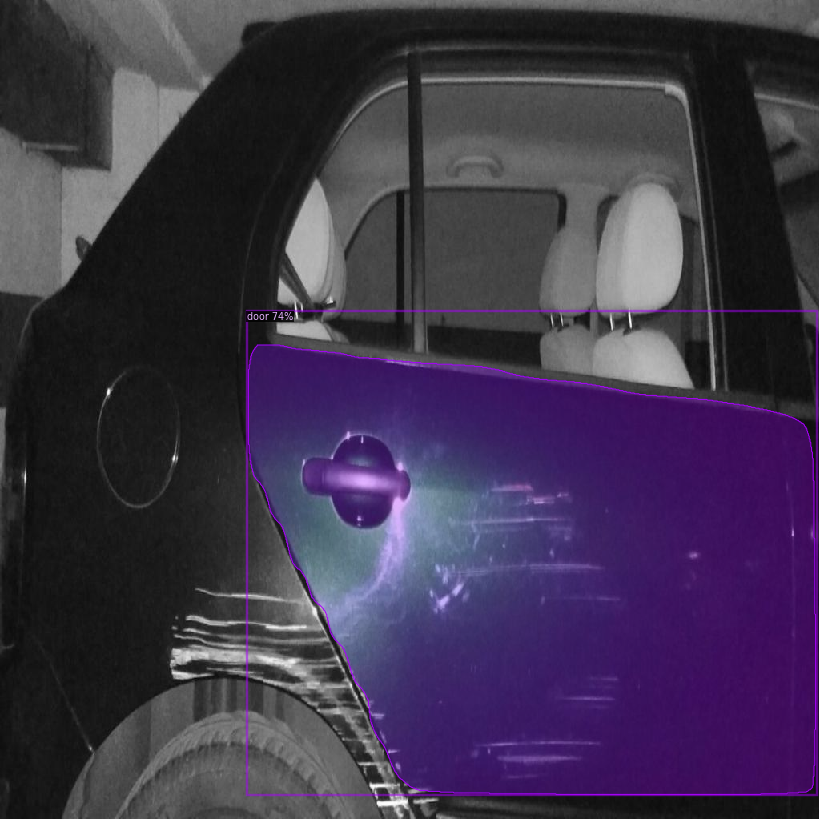

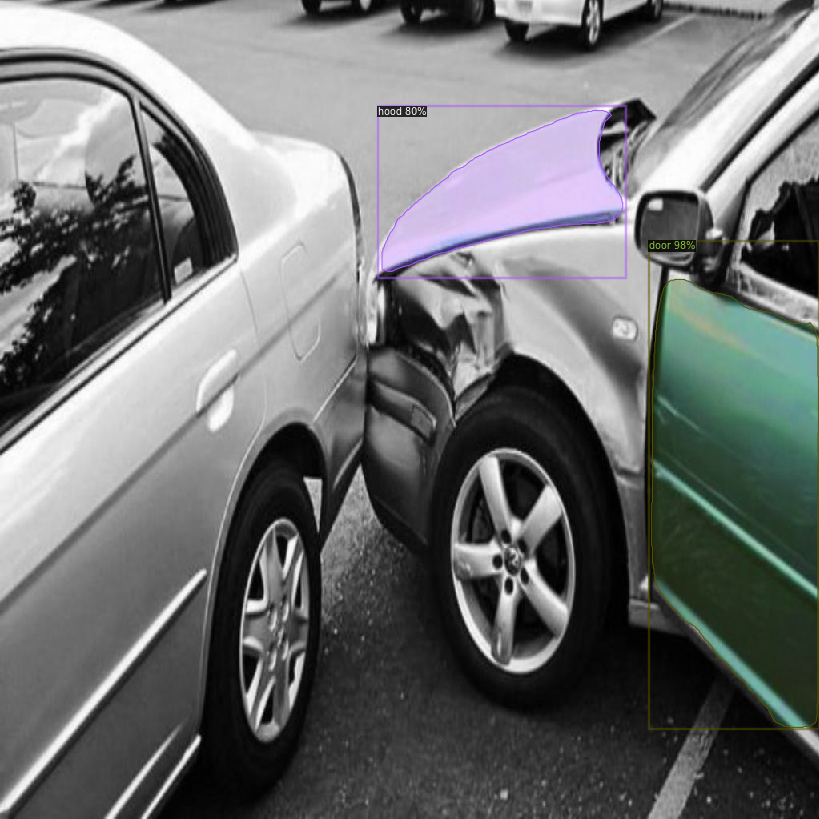

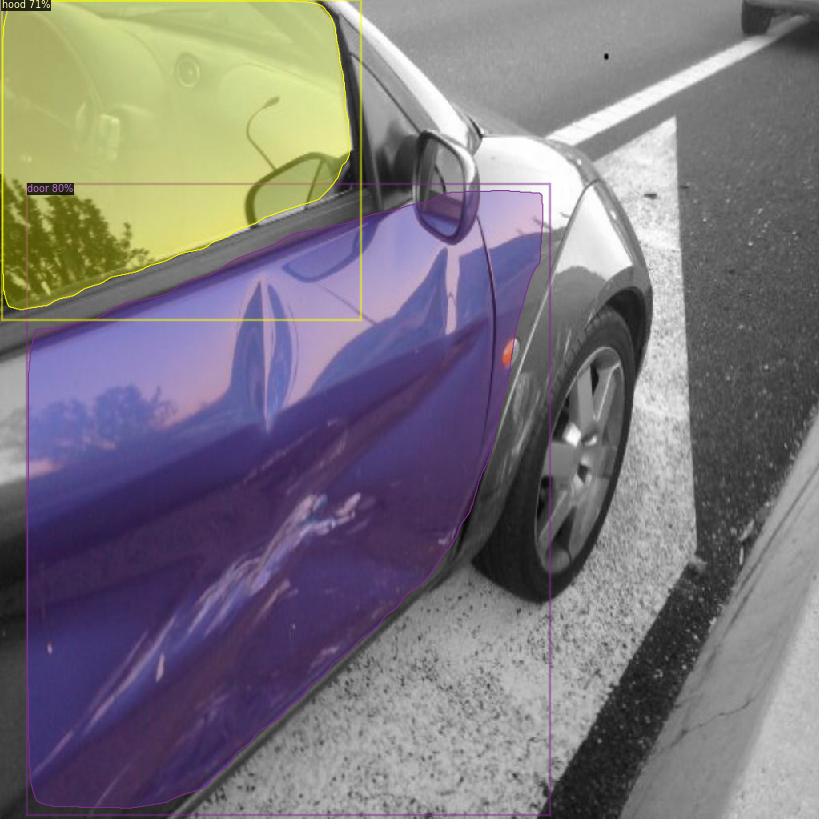

In [18]:
from detectron2.utils.visualizer import ColorMode
for d in random.sample(val_dataset_dicts,6):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=MetadataCatalog.get("my_dataset_val"), 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [19]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))


[03/19 11:32:24 d2.data.datasets.coco]: Loaded 11 images in COCO format from /content/val/COCO_mul_val_annos.json
[03/19 11:32:24 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[03/19 11:32:24 d2.data.common]: Serializing 11 elements to byte tensors and concatenating them all ...
[03/19 11:32:24 d2.data.common]: Serialized dataset takes 0.01 MiB
[03/19 11:32:24 d2.evaluation.evaluator]: Start inference on 11 batches


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[03/19 11:32:28 d2.evaluation.evaluator]: Inference done 11/11. Dataloading: 0.0009 s/iter. Inference: 0.2735 s/iter. Eval: 0.0121 s/iter. Total: 0.2865 s/iter. ETA=0:00:00
[03/19 11:32:28 d2.evaluation.evaluator]: Total inference time: 0:00:01.827553 (0.304592 s / iter per device, on 1 devices)
[03/19 11:32:28 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.273503 s / iter per device, on 1 devices)
[03/19 11:32:28 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[03/19 11:32:28 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[03/19 11:32:29 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[03/19 11:32:29 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[03/19 11:32:29 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[03/19 11:32:29 d2.evaluation.

In [20]:
import pickle
filename= 'parts_detection_model'
with open(filename, 'wb') as f:
     pickle.dump(cfg, f)